Found metadata files: ['openai_clip-vit-base-patch32_CUB_200_2011_metadata.json', 'openai_clip-vit-base-patch32_Flower102_metadata.json', 'openai_clip-vit-base-patch32_NWPU-RESISC45_metadata.json', 'openai_clip-vit-base-patch32_Stanford_dogs_metadata.json', 'openai_clip-vit-base-patch32_wds_cars_metadata.json', 'openai_clip-vit-base-patch32_wds_fgvc_aircraft_metadata.json', 'openai_clip-vit-base-patch32_wds_food101_metadata.json', 'openai_clip-vit-base-patch32_wds_imagenetv2_metadata.json', 'openai_clip-vit-base-patch32_wds_vtab-cifar100_metadata.json', 'openai_clip-vit-base-patch32_wds_vtab-pets_metadata.json']
Processing: results\qualitative_analysis\openai_clip-vit-base-patch32_CUB_200_2011_metadata.json


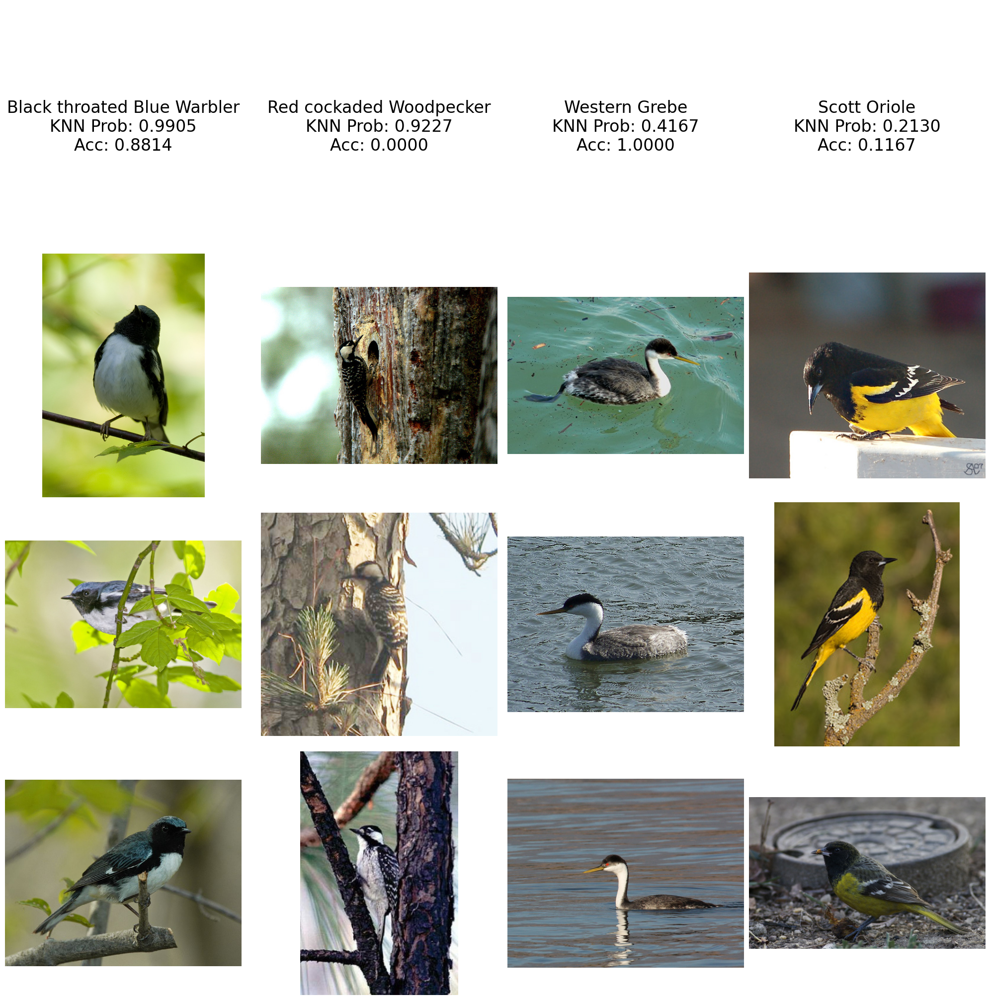

Composite figure saved to results\qualitative_analysis\openai_clip-vit-base-patch32_CUB_200_2011_composite.png
Processing: results\qualitative_analysis\openai_clip-vit-base-patch32_Flower102_metadata.json


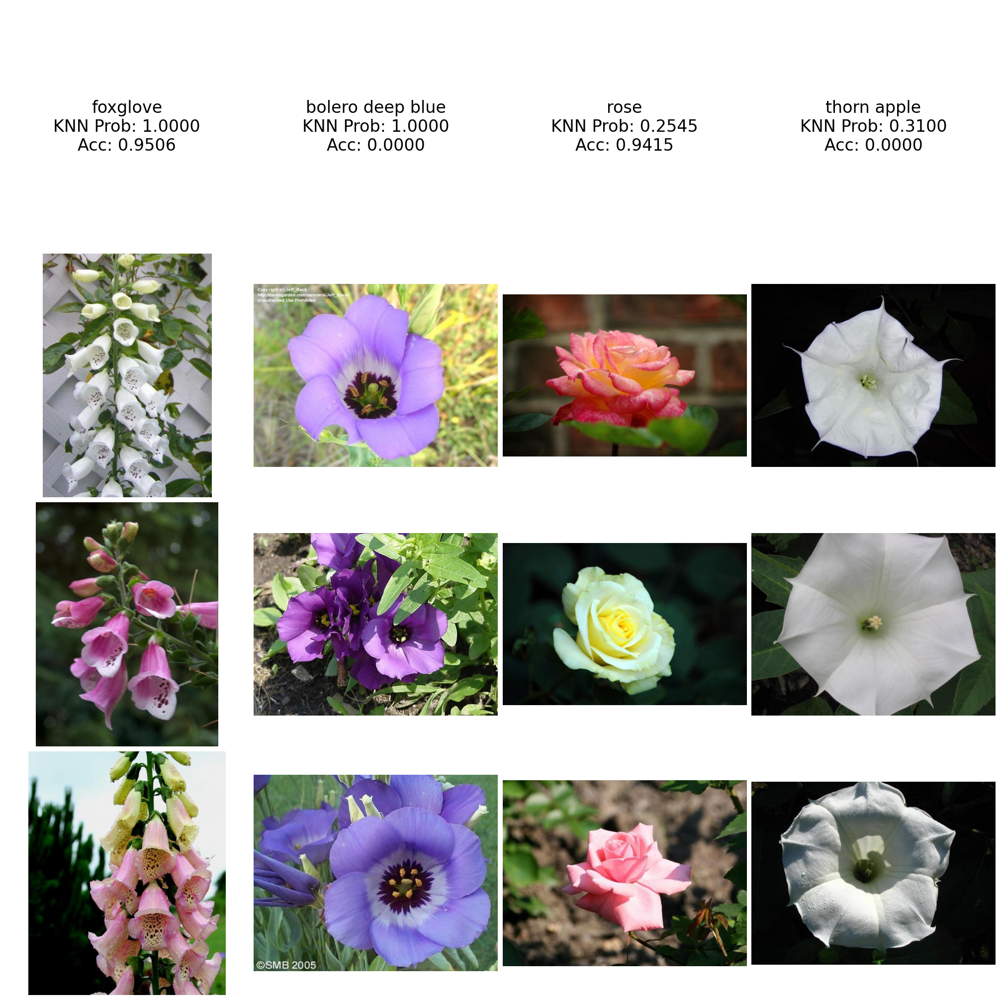

Composite figure saved to results\qualitative_analysis\openai_clip-vit-base-patch32_Flower102_composite.png
Processing: results\qualitative_analysis\openai_clip-vit-base-patch32_NWPU-RESISC45_metadata.json


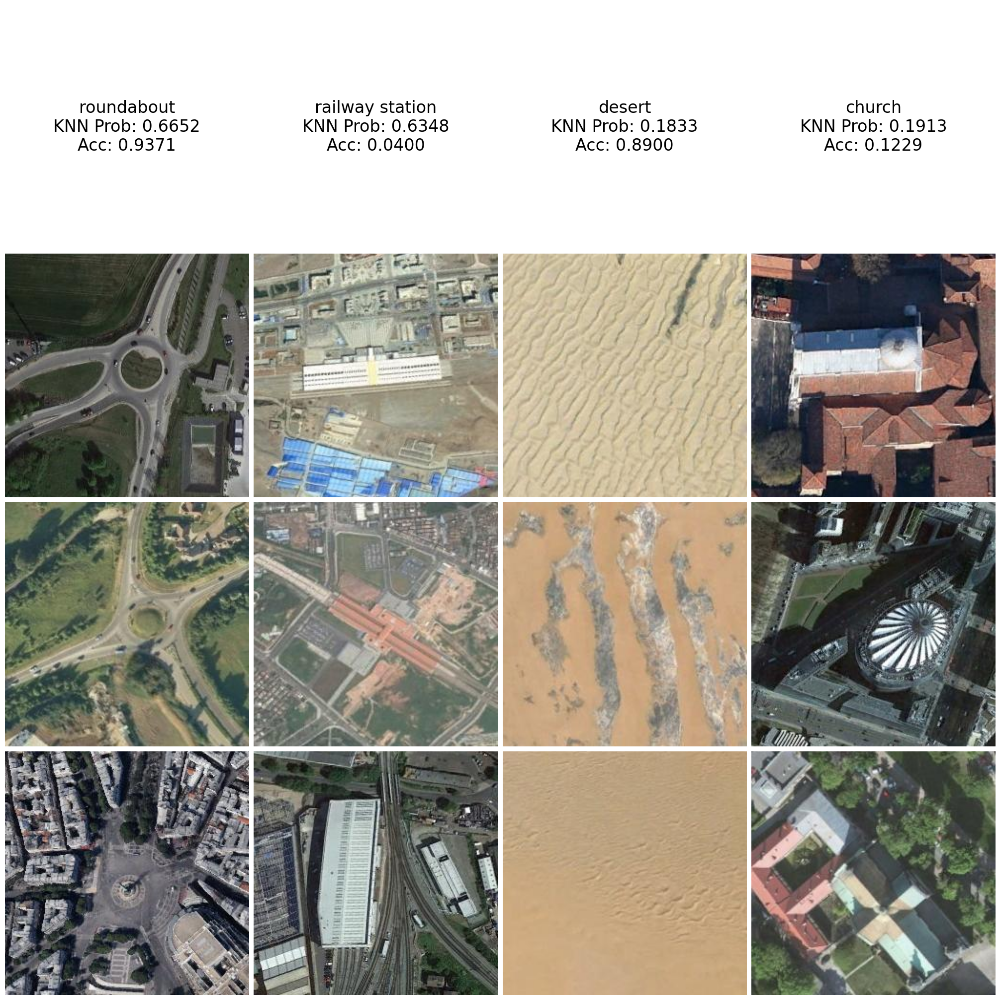

Composite figure saved to results\qualitative_analysis\openai_clip-vit-base-patch32_NWPU-RESISC45_composite.png
Processing: results\qualitative_analysis\openai_clip-vit-base-patch32_Stanford_dogs_metadata.json


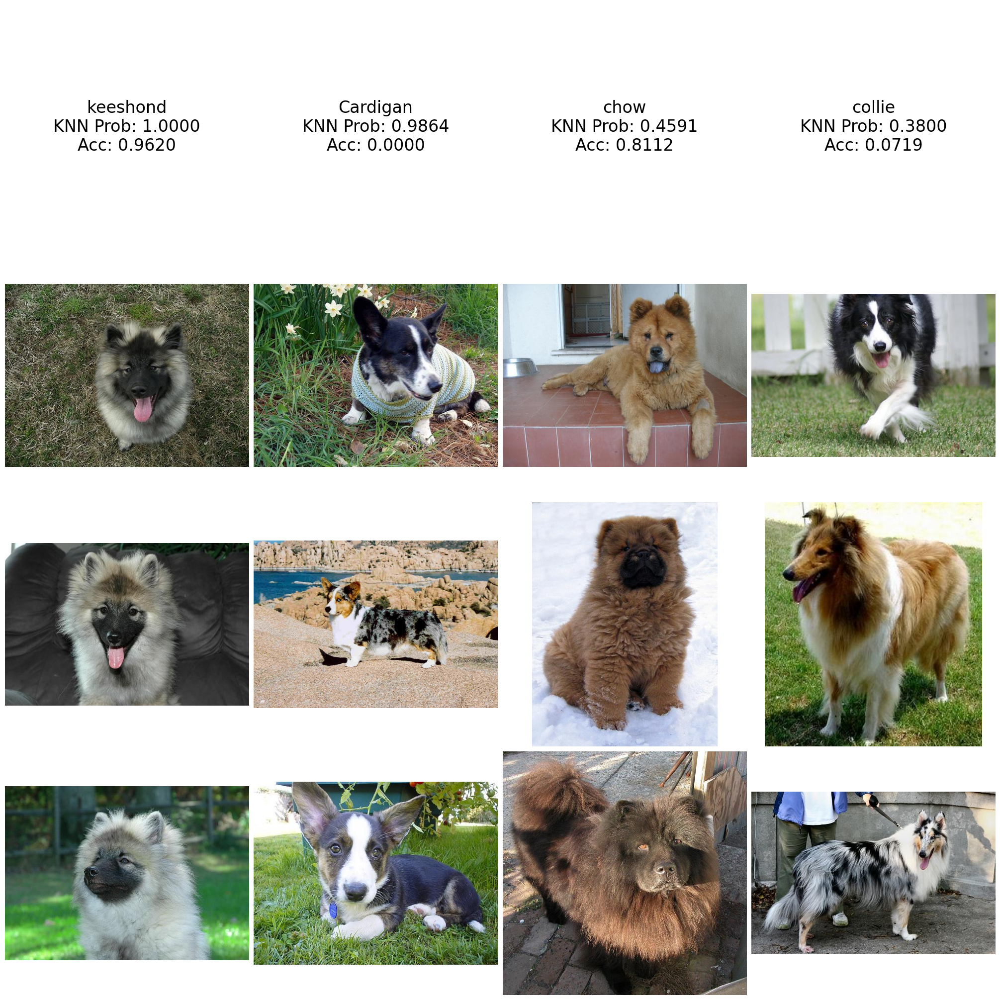

In [ ]:
# create_figures.py

# Import necessary libraries
import os
import json
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def main():
    # Define paths
    results_dir = 'results'  # Adjust if different
    qualitative_dir = os.path.join(results_dir, 'qualitative_analysis')

    # List metadata files
    metadata_files = [f for f in os.listdir(qualitative_dir) if f.endswith('_metadata.json')]
    if not metadata_files:
        print('No metadata files found in', qualitative_dir)
        return
    print('Found metadata files:', metadata_files)

    # Process each metadata file
    for metadata_file in metadata_files:
        metadata_path = os.path.join(qualitative_dir, metadata_file)
        print('Processing:', metadata_path)

        # Load metadata
        with open(metadata_path, 'r') as f:
            metadata = json.load(f)

        # Number of images per class to display
        num_images = 3  # Adjust as needed

        # Set up the figure with increased default font size and constrained layout
        plt.rcParams.update({'font.size': 14})  # Increase default font size
        fig, axes = plt.subplots(nrows=num_images+1, ncols=4, 
                                 figsize=(20, 5*(num_images+1)),
                                 constrained_layout=True)  # Use constrained_layout for better spacing

        # Define a mapping from case names to column indices
        case_to_col = {
            'High KNN, High Acc': 0,
            'High KNN, Low Acc': 1,
            'Low KNN, High Acc': 2,
            'Low KNN, Low Acc': 3,
        }

        # Process each case
        for entry in metadata:
            case = entry['case']
            class_name = entry['class_name']
            knn_prob = entry['knn_probability']
            zero_shot_acc = entry['zero_shot_accuracy']
            images = entry['images'][:num_images]  # Limit to num_images

            col = case_to_col.get(case)
            if col is None:
                print(f"Unknown case: {case}")
                continue

            # Display the metadata in the top row
            axes[0, col].axis('off')
            metadata_text = (
                f"{class_name}\n"
                #              f"{case}\n"
                             f"KNN Prob: {knn_prob:.4f}\n"
                             f"Acc: {zero_shot_acc:.4f}")
            axes[0, col].text(0.5, 0.5, metadata_text,
                             ha='center', va='center', fontsize=24, wrap=True)

            # Display the images
            for i, img_path in enumerate(images):
                img = Image.open(img_path)
                axes[i+1, col].imshow(img)
                axes[i+1, col].axis('off')

        # If not using constrained_layout, you can adjust padding manually
        # plt.tight_layout()
        # # Or use plt.subplots_adjust to fine-tune margins
        # fig.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.2)

        # Show the plot (optional)
        # plt.show()

        # Save the figure
        figure_filename = metadata_file.replace('_metadata.json', '_composite.png')
        figure_path = os.path.join(qualitative_dir, figure_filename)
        plt.show()
        fig.savefig(figure_path, dpi=300)  # Increased dpi for better quality
        print(f"Composite figure saved to {figure_path}")
        plt.close(fig)  # Close the figure to free memory

if __name__ == '__main__':
    main()
